In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import HDBSCAN
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from umap import UMAP

from data_frame import MAGNITUDES, COLORS
# import models

DATAPATH = "../dataframes/experiment3/MG_3_components_3.csv"
columns_25 = [f"percentile_{i}" for i in np.arange(5,100,5)]
columns_100 = [f"percentile_{i}" for i in np.arange(1,100,1)]

df = pd.read_csv(DATAPATH, index_col=0)
df, indices = df.loc[(df["split"] == "test")], df.index

<b>Wykresy korelacji</b>

In [28]:
# sns.pairplot(df, x_vars=["Z_pred_std"], y_vars=COLORS, kind="scatter")

<b>Redukcja wymiarów T-sne/UMAP</b>

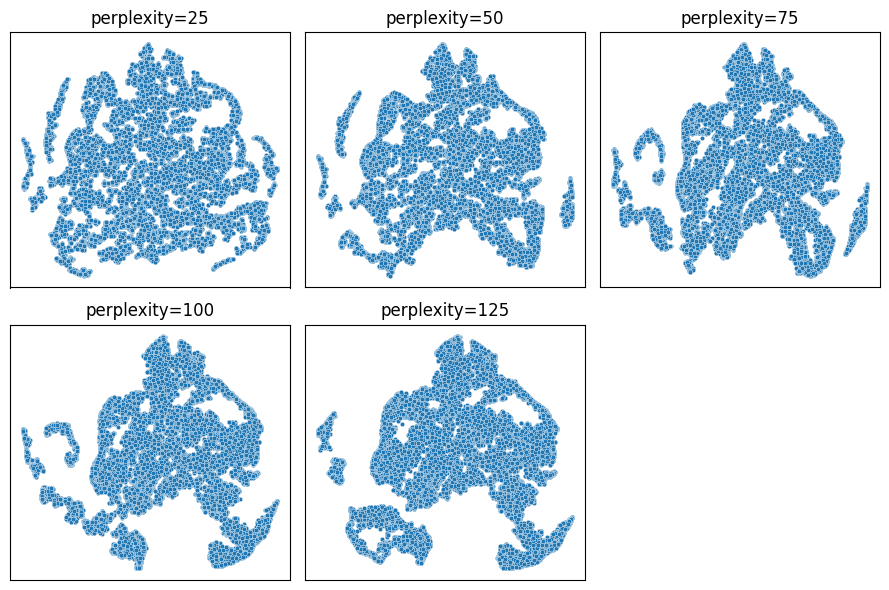

In [44]:
perplexities = [25, 50, 75, 100, 125]
n = len(perplexities)

# choose grid size roughly square
ncols = int(np.ceil(np.sqrt(n)))
nrows = int(np.ceil(n / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(3*ncols, 3*nrows))
axes = axes.flatten()

for i, perplexity in enumerate(perplexities):
    X_embedded = TSNE(
        n_components=2,
        n_jobs=-1,
        max_iter=1000,
        perplexity=perplexity,
        random_state=746329
    ).fit_transform(df[columns_100])

    ax = axes[i]
    sns.scatterplot(x=X_embedded[:, 0], y=X_embedded[:, 1], ax=ax, s=10)
    ax.set_title(f"perplexity={perplexity}")
    ax.grid(True)
    ax.set_xticks([])
    ax.set_yticks([])

# turn off any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

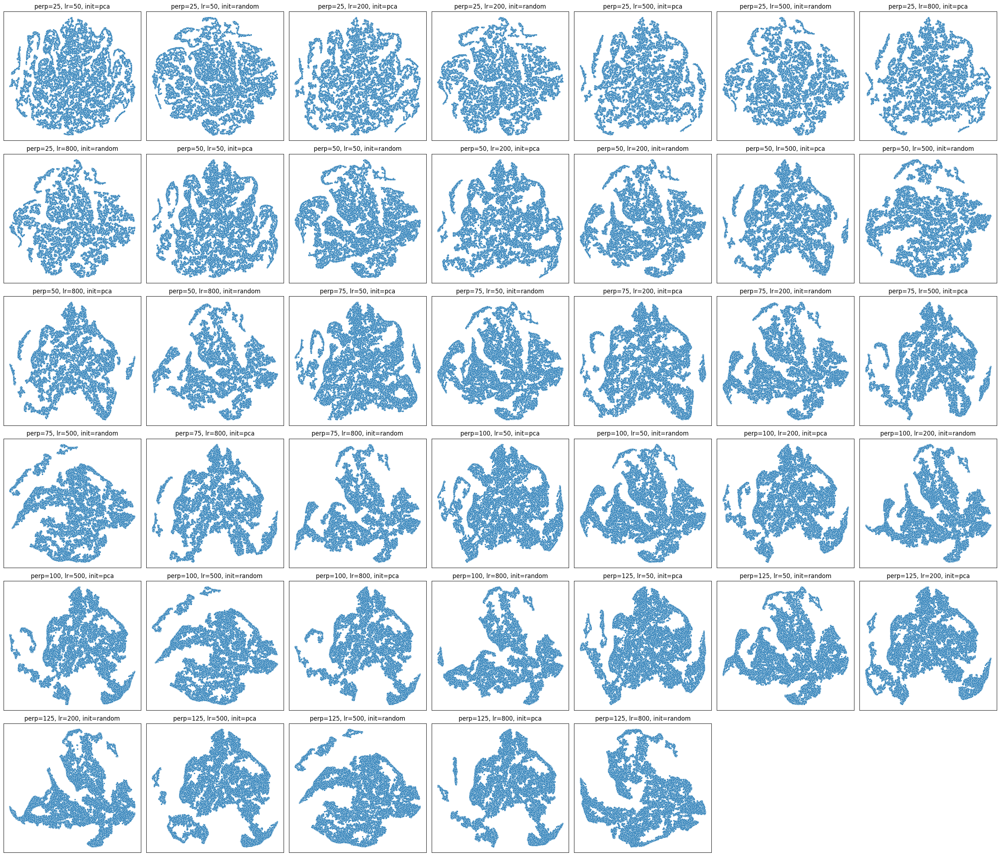

In [48]:
X = df[columns_100].values

# grid to try (keeps total runs reasonable)
perplexities = [25, 50, 75, 100, 125]
learning_rates = [50, 200, 500, 800]
inits = ['pca', 'random']

# create combinations but limit to e.g. the first 9 combos to keep plot readable
from itertools import product
combos = list(product(perplexities, learning_rates, inits))
combos = combos  # 9 subplots (3x3) for quick visual inspection

n = len(combos)
ncols = int(np.ceil(np.sqrt(n)))
nrows = int(np.ceil(n / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows))
axes = axes.flatten()

for i, (perp, lr, init) in enumerate(combos):
    tsne = TSNE(
        n_components=2,
        perplexity=perp,
        learning_rate=lr,
        max_iter=1000,            # quick exploration
        init=init,
        random_state=0,
        n_jobs=-1
    )
    emb = tsne.fit_transform(X)
    ax = axes[i]
    sns.scatterplot(x=emb[:,0], y=emb[:,1], s=8, ax=ax)
    ax.set_title(f"perp={perp}, lr={lr}, init={init}")
    ax.set_xticks([])
    ax.set_yticks([])

# turn off empty axes if any
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

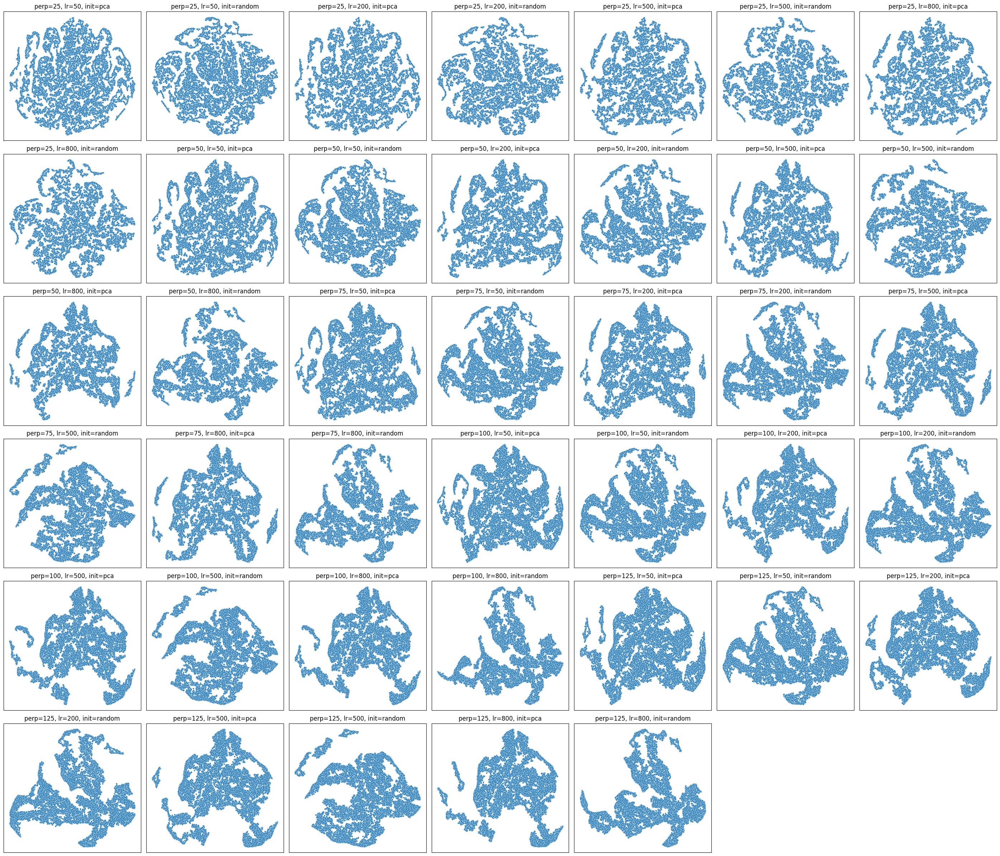

In [49]:
X = StandardScaler().fit_transform(df[columns_100])

# grid to try (keeps total runs reasonable)
perplexities = [25, 50, 75, 100, 125]
learning_rates = [50, 200, 500, 800]
inits = ['pca', 'random']

# create combinations but limit to e.g. the first 9 combos to keep plot readable
from itertools import product
combos = list(product(perplexities, learning_rates, inits))
combos = combos  # 9 subplots (3x3) for quick visual inspection

n = len(combos)
ncols = int(np.ceil(np.sqrt(n)))
nrows = int(np.ceil(n / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows))
axes = axes.flatten()

for i, (perp, lr, init) in enumerate(combos):
    tsne = TSNE(
        n_components=2,
        perplexity=perp,
        learning_rate=lr,
        max_iter=1000,            # quick exploration
        init=init,
        random_state=0,
        n_jobs=-1
    )
    emb = tsne.fit_transform(X)
    ax = axes[i]
    sns.scatterplot(x=emb[:,0], y=emb[:,1], s=8, ax=ax)
    ax.set_title(f"perp={perp}, lr={lr}, init={init}")
    ax.set_xticks([])
    ax.set_yticks([])

# turn off empty axes if any
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

<b>Clustering</b>

<b>Histogramy clustrów</b>